In [1]:
from process import *
from visualize import *
from glycowork.motif.annotate import *
from glycowork.motif.graph import *
import os
import warnings
warnings.filterwarnings("ignore")

# Case studies and applications of GlyContact

## 1 - Glycans with one major structural cluster
Each glycan structure is described on GlycoShape by multiple PDB files, corresponding to multiple structural clusters. Structures were obtained using Molecular Dynamic simulations (MD) and classified based on similarity within these conformational clusters.

Using GlyContact, we can search for major glycan structures, meaning glycans with one favored conformation.

In [2]:
### The following function returns glycans with one preferred conformation according to a frequency threshold
### Here, having a preferred conformation means having a cluster observed with a frequency >= 70%
res = glycan_cluster_pattern(threshold = 70)

### Glycans with a major cluster are saved in the first list returned by glycan_cluster_pattern
print(res[0])

Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
['Man3Me(a1-3)[Man3Me(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc', 'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc', 'IdoA2S(a1-4)GlcNS6S', 'Fuc(a1-3)[Fuc(a1-2)Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-3)Glc', 'Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)][Fuc(a1-3)]GlcNAc', 'Gal(b1-4)Glc', 'GlcNAc(b1-2)Man(a1-3)[GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)GlcNAc', 'Fuc', 'Fuc(a1-3)[Fuc(a1-3)[Fuc(a1-2)Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)]GlcNAc(b1-4)Glc', 'Man', 'GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc', 'Man(a1-3)[Xyl(b1-2)][Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc', 'GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA', 'GalNAc(b1-3)GlcNAc(b1-4)Man', 'Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Ma

Number of glycans with one major cluster: 2
Number of glycans without a major cluster: 446
Number of glycans with one major cluster: 2
Number of glycans without a major cluster: 446
Number of glycans with one major cluster: 5
Number of glycans without a major cluster: 443
Number of glycans with one major cluster: 5
Number of glycans without a major cluster: 443
Number of glycans with one major cluster: 9
Number of glycans without a major cluster: 439
Number of glycans with one major cluster: 14
Number of glycans without a major cluster: 434
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 33
Number of glycans without a major cluster: 415
Number of glycans with one major cluster: 55
Number of glycans without a major cluster: 393
Number of glycans with one major cluster: 72
Number of glycans without a major cluster: 376
Number of glycans with one major cluster: 104
Number of glycans without a major clust

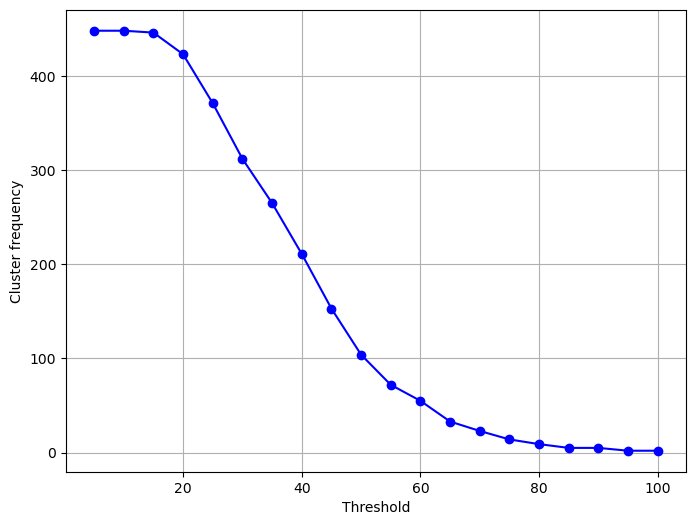

In [6]:
### Let see distribution of cluster frequencies for different thresholds

x = []
freq = []
for threshold in range(100,0,-5):
    x.append(threshold)
    freq.append(len(glycan_cluster_pattern(threshold)[0]))

plt.figure(figsize=(8, 6))
plt.plot(x, freq, marker='o', linestyle='-', color='b')  # Line plot with markers
plt.xlabel('Threshold')
plt.ylabel('Cluster frequency')
plt.grid(True)
plt.show()


In [4]:
### Lets investigate which glycans have a major cluster with different thresholds
for threshold in range(100,50,-10):
    print("\nThreshold: " + str(threshold))
    for g in glycan_cluster_pattern(threshold)[0] :
        print(g)



Threshold: 100
Number of glycans with one major cluster: 2
Number of glycans without a major cluster: 446
Fuc
Man

Threshold: 90
Number of glycans with one major cluster: 5
Number of glycans without a major cluster: 443
Fuc
Fuc(a1-3)[Fuc(a1-3)[Fuc(a1-2)Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)]GlcNAc(b1-4)Glc
Man
GalNAc(b1-3)GlcNAc(b1-4)Man
Fuc(a1-3)[Neu5Ac(a2-3)Gal(b1-4)]GlcNAc(b1-3)Gal

Threshold: 80
Number of glycans with one major cluster: 9
Number of glycans without a major cluster: 439
Fuc(a1-3)[Fuc(a1-2)Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-3)Glc
Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)][Fuc(a1-3)]GlcNAc
Fuc
Fuc(a1-3)[Fuc(a1-3)[Fuc(a1-2)Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)]GlcNAc(b1-4)Glc
Man
GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)GlcA
GalNAc(b1-3)GlcNAc(b1-4)Man
Fuc(a1-3)[Gal(b1-4)]GlcNAc(b1-2)[GlcNAc(b1-4)]Man(a1-3)[GlcNAc(b1-2)[GlcNAc(b1-6)]Man(a1-6)][GlcNAc(b1-4)

In [7]:
### is it related to a specific silhouette?
for threshold in range(100,50,-10):
    print("\nThreshold: " + str(threshold))
    for g in glycan_cluster_pattern(threshold)[0] :
        print(convert_glycan_to_X(g))

### Doesn't seem so



Threshold: 100
Number of glycans with one major cluster: 2
Number of glycans without a major cluster: 446
X
X

Threshold: 90
Number of glycans with one major cluster: 5
Number of glycans without a major cluster: 443
X
X[X[XX]XX]XX
X
XXX
X[XX]XX

Threshold: 80
Number of glycans with one major cluster: 9
Number of glycans without a major cluster: 439
X[XX]XXXX
XXX[XXX][X]XX[X][X]X
X
X[X[XX]XX]XX
X
XXXXXXXXXX
XXX
X[X]X[X]X[X[X]X][X]XXX
X[XX]XX

Threshold: 70
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
X[X]XXX
XXX[XXX]XXX
XX
X[XX]XXXX
XXX[XXX][X]XX[X][X]X
XX
XX[XX][X]XXX
X
X[X[XX]XX]XX
X
XXXX
X[X][X]XX[X]X
XXXXXXXXXX
XXX
XXXX[XXXX]XXX
X[X]X
X[X]X[X]X[X[X]X][X]XXX
X[XX]XX
XXXXX
XXX
XX[XX]X[XXXX]XX[X]X
XXX[XXX][X]XX[X]X
XXXXXXXXXXXXXXXXXXXX

Threshold: 60
Number of glycans with one major cluster: 55
Number of glycans without a major cluster: 393
X[X]XXX
XXX[XXX]XXX
XXXXX[XX[XX]X]XXX
XXX[X[X]XX]XX[X]X
XXXXXXXXXXX
XXXXX
XX
X[XX]XXXX
XXX[XX[XX]X]

In [6]:
### Is it related to the presence of a given monosaccharide?
df = pd.DataFrame()
list_monothresh = []
list_major_prop = []
list_minor_prop = []
for mono in ['Fuc', 'Man', 'GlcNAc', 'GalNAc', 'Neu5Ac', 'Neu5Gc', 'Glc', 'Gal', 'Xyl', "GlcA", "Rha", "IdoA", "GlcNS"] : 
    for threshold in range(100,0,-10):
        mono_threshold = mono + '_' + str(threshold)
        list_monothresh.append(mono_threshold)

        res = glycan_cluster_pattern(threshold)
        total_with_major = len(res[0])
        total_without_major = len(res[1])
        mono_containing_major = 0
        mono_containing_others = 0
        for g in res[0] :
            if mono in g :
                mono_containing_major = mono_containing_major + 1
        for g in res[1] :
            if mono in g :
                mono_containing_others = mono_containing_others + 1
        try :
            percent_major_containing_mono = mono_containing_major/total_with_major*100
        except :
            percent_major_containing_mono = 0

        try :
            percent_others_containing_mono = mono_containing_others/total_without_major*100
        except : 
            percent_others_containing_mono = 0

        list_major_prop.append(percent_major_containing_mono)
        list_minor_prop.append(percent_others_containing_mono)

df['Monosaccharide_threshold'] = list_monothresh
df['Proportion_in_major'] = list_major_prop
df['Proportion_in_others'] = list_minor_prop

df

Number of glycans with one major cluster: 2
Number of glycans without a major cluster: 446
Number of glycans with one major cluster: 5
Number of glycans without a major cluster: 443
Number of glycans with one major cluster: 9
Number of glycans without a major cluster: 439
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 55
Number of glycans without a major cluster: 393
Number of glycans with one major cluster: 104
Number of glycans without a major cluster: 344
Number of glycans with one major cluster: 211
Number of glycans without a major cluster: 237
Number of glycans with one major cluster: 312
Number of glycans without a major cluster: 136
Number of glycans with one major cluster: 423
Number of glycans without a major cluster: 25
Number of glycans with one major cluster: 448
Number of glycans without a major cluster: 0
Number of glycans with one major cluster: 2
Number of glycans without a major clu

KeyboardInterrupt: 

In [ ]:
df

,Monosaccharide_threshold,Proportion_in_major,Proportion_in_others
0,Fuc_100,50.000000,45.964126
1,Fuc_90,60.000000,45.823928
2,Fuc_80,66.666667,45.558087
3,Fuc_70,47.826087,45.882353
4,Fuc_60,40.000000,46.819338
...,...,...,...
125,GlcNS_50,2.884615,3.488372
126,GlcNS_40,2.843602,3.797468
127,GlcNS_30,2.884615,4.411765
128,GlcNS_20,3.309693,4.000000


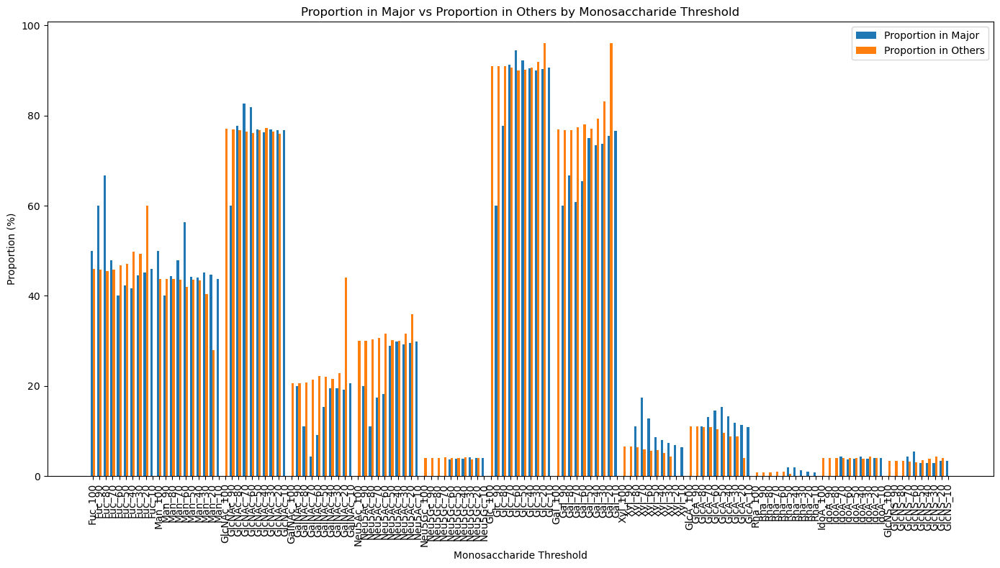

In [ ]:
bar_width = 0.35
index = np.arange(len(df['Monosaccharide_threshold']))

# Plotting the bars
plt.figure(figsize=(14, 8))
bar1 = plt.bar(index, df['Proportion_in_major'], bar_width, label='Proportion in Major')
bar2 = plt.bar(index + bar_width, df['Proportion_in_others'], bar_width, label='Proportion in Others')

# Adding labels, title, and custom X-axis tick labels
plt.xlabel('Monosaccharide Threshold')
plt.ylabel('Proportion (%)')
plt.title('Proportion in Major vs Proportion in Others by Monosaccharide Threshold')
plt.xticks(index + bar_width / 2, df['Monosaccharide_threshold'], rotation=90)

# Adding the legend
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

In [ ]:
### Fixing only two groups: glycans with a cluster >=50 vs < 50
df = pd.DataFrame()
list_monothresh = []
list_major_prop = []
list_minor_prop = []
for mono in ['Fuc', 'Man', 'GlcNAc', 'GalNAc', 'Neu5Ac', 'Neu5Gc', 'Glc', 'Gal', 'Xyl', "GlcA", "Rha", "IdoA", "GlcNS", "a1-2", "a1-3", "a2-3", "a2-6", "a1-6", "b1-2", "b1-3", "b1-4", "3S", "6S", "Me"] : 
    for threshold in [70]:
        mono_threshold = mono + '_' + str(threshold)
        list_monothresh.append(mono_threshold)

        res = glycan_cluster_pattern(threshold)
        total_with_major = len(res[0])
        total_without_major = len(res[1])
        mono_containing_major = 0
        mono_containing_others = 0
        for g in res[0] :
            if mono in g :
                mono_containing_major = mono_containing_major + 1
        for g in res[1] :
            if mono in g :
                mono_containing_others = mono_containing_others + 1
        try :
            percent_major_containing_mono = mono_containing_major/total_with_major*100
        except :
            percent_major_containing_mono = 0

        try :
            percent_others_containing_mono = mono_containing_others/total_without_major*100
        except : 
            percent_others_containing_mono = 0

        list_major_prop.append(percent_major_containing_mono)
        list_minor_prop.append(percent_others_containing_mono)

df['Monosaccharide_threshold'] = list_monothresh
df['Proportion_in_major'] = list_major_prop
df['Proportion_in_others'] = list_minor_prop

Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major cluster: 425
Number of glycans with one major cluster: 23
Number of glycans without a major c

In [ ]:
df

,Monosaccharide_threshold,Proportion_in_major,Proportion_in_others
0,Fuc_70,47.826087,45.882353
1,Man_70,47.826087,43.529412
2,GlcNAc_70,82.608696,76.470588
3,GalNAc_70,4.347826,21.411765
4,Neu5Ac_70,17.391304,30.588235
5,Neu5Gc_70,0.000000,4.235294
6,Glc_70,91.304348,90.588235
7,Gal_70,60.869565,77.411765
8,Xyl_70,17.391304,5.882353
9,GlcA_70,13.043478,10.823529


In [ ]:
### what about repeating the analysis by silhouette_clusters?

## 2 - Monosaccharide SASA and flexibility between glycan classes (N-/O- glycans)

In [8]:
glycoshape_glycans = get_glycoshape_IUPAC()
nglycans = []
other_glycans = []
for g in glycoshape_glycans :
    if 'Man(b1-4)GlcNAc(b1-4)' in g :
        nglycans.append(g)
    else :
        other_glycans.append(g)
print(len(nglycans))
print(len(other_glycans))

168
285


Flexibility

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

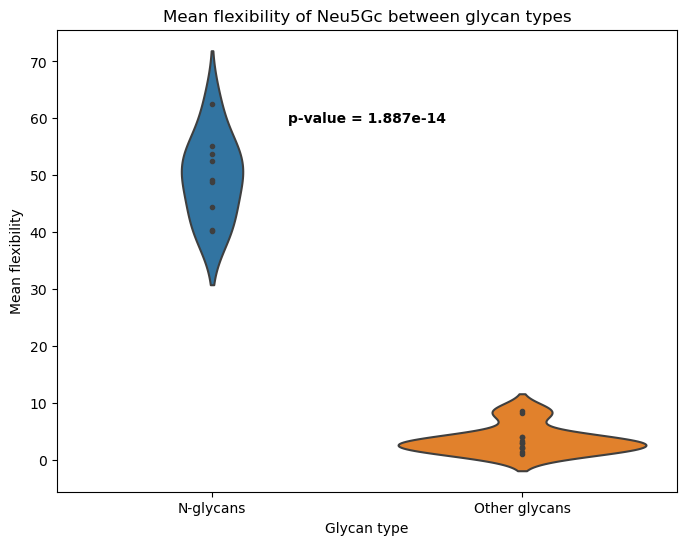

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('b1-4', 'Man')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages

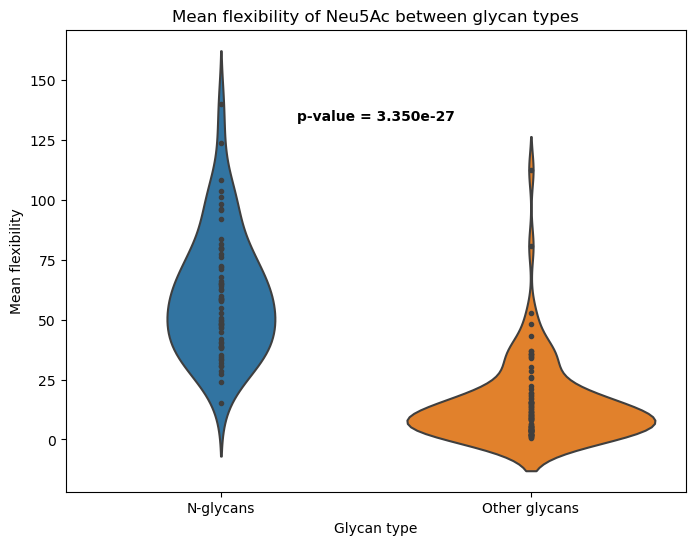

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
Filtered Differences: [('Fuc', 'a1-3'), ('a1-3', 'GlcNAc')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('Xyl', 'b1-2')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a s

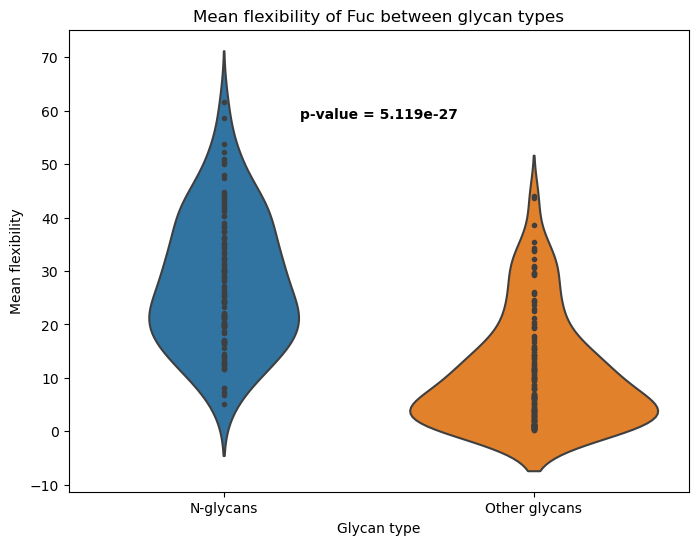

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

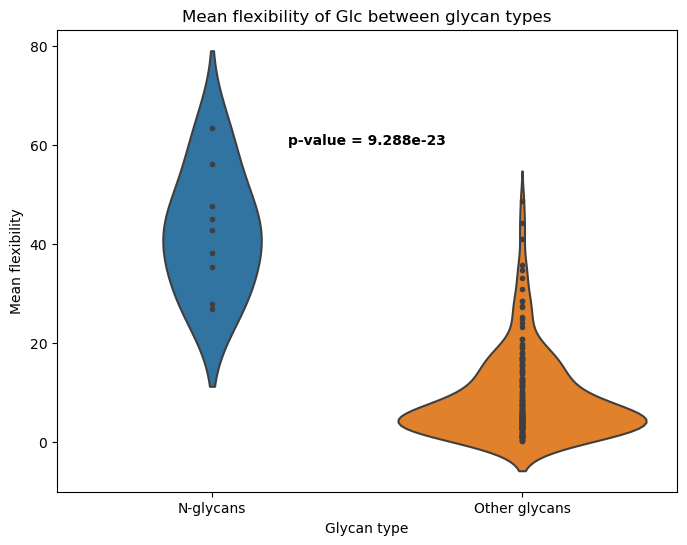

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('b1-4', 'Man')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages

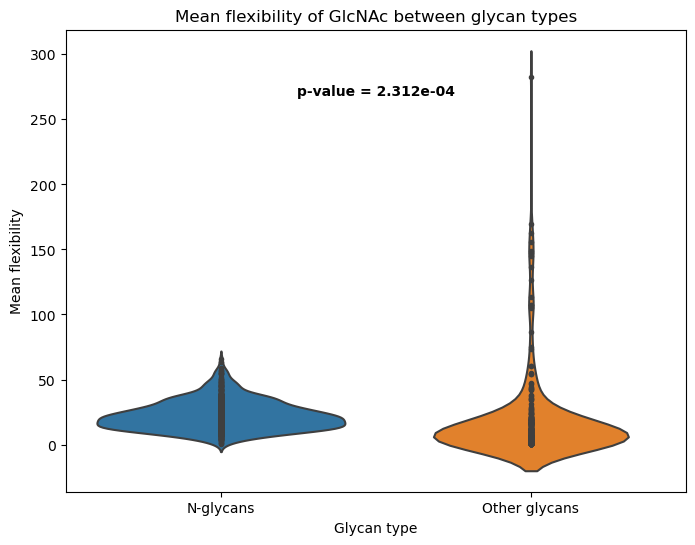

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('b1-4', 'Man')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages

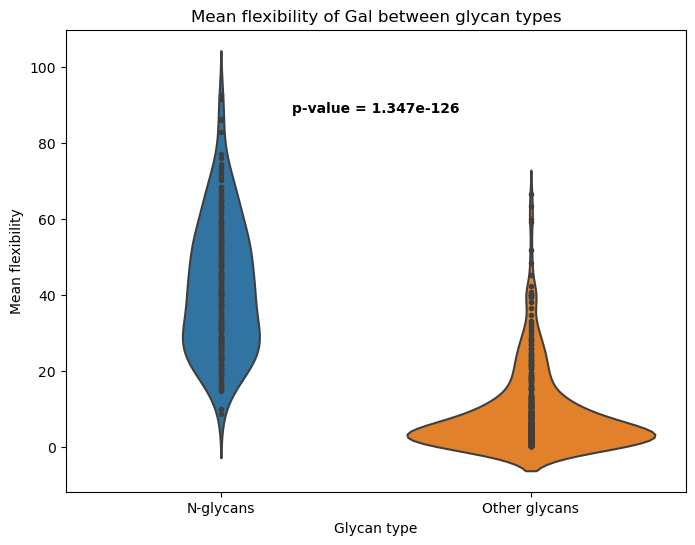

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

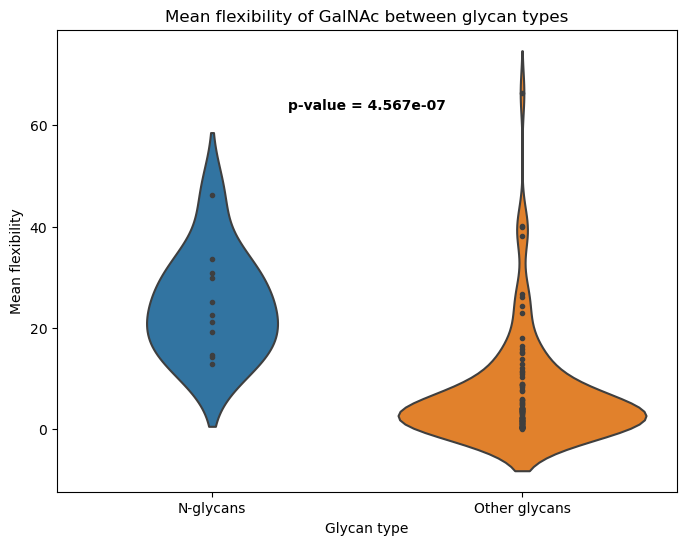

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
Missing monosaccharide in mapping_dict
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('b1-4', 'Man')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages

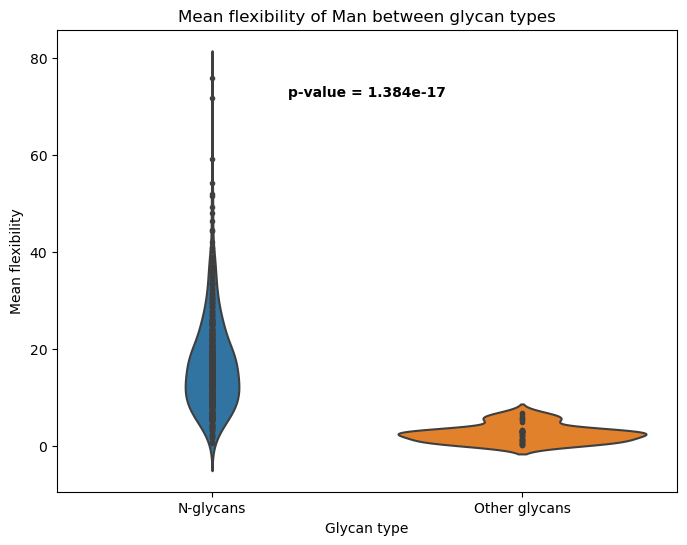

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

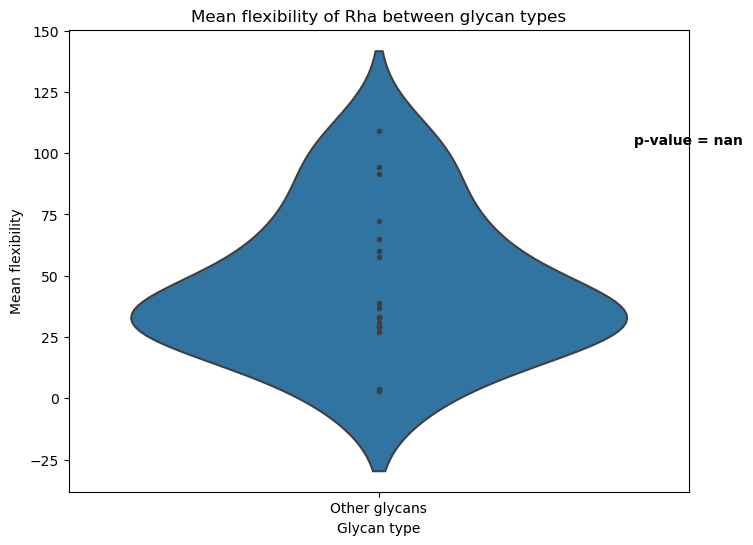

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
Filtered Differences: [('Fuc', 'a1-3'), ('a1-3', 'GlcNAc')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a single molecule, as expected
Filtered Differences: [('Xyl', 'b1-2')]
Differences in annotations
glycowork and glycontact do not agree on the list of covalent linkages in this glycan. It is probable that glycontact encountered a problem with PDB monosaccharide conversion, or detecting linkages
Filtered Differences: []
glycowork and glycontact agree on the list of covalent linkages
Building a network from glycontact interactions generate a s

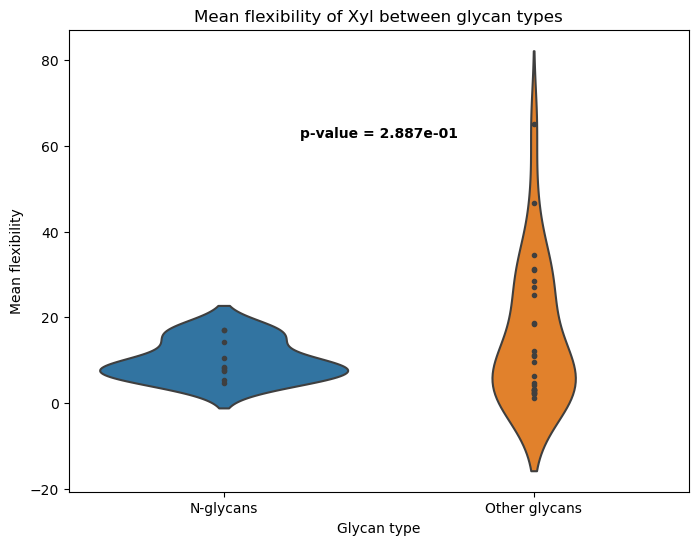

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

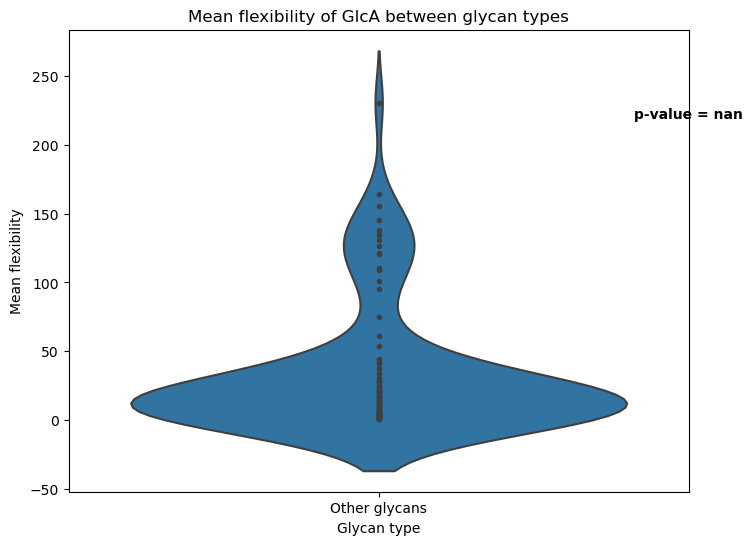

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

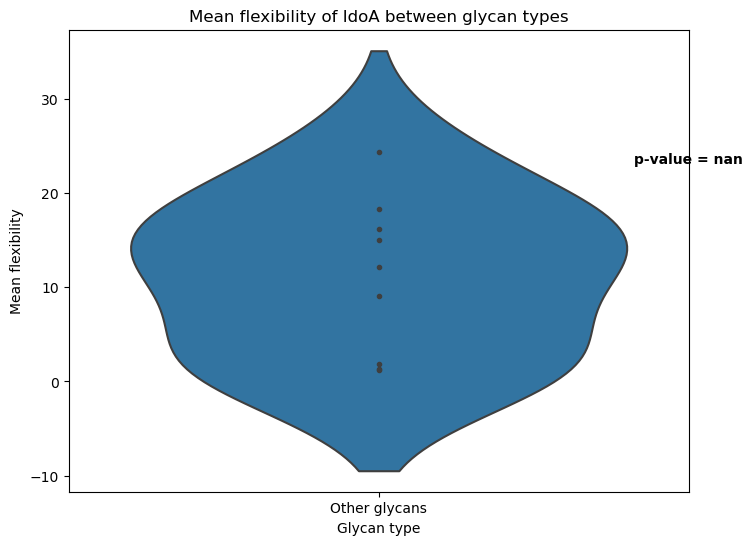

['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Xyl']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'GlcNAc6S', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Fuc', 'Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'Gal', 'GlcNAc', 'Man']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Gal', 'GlcNAc', 'Man', 'Neu5Ac']
['Fuc', 'GalNAc', 'G

ValueError: min() arg is an empty sequence

<Figure size 800x600 with 0 Axes>

In [ ]:
from glycowork.motif.annotate import *
from scipy.stats import ttest_ind
'''
# N-glycans
mono_list = ['Neu5Gc', 'Neu5Ac', 'Fuc', 'Glc', 'GlcNAc', 'Gal', 'GalNAc', 'Man', 'Rha', 'Xyl', 'GlcA', 'IdoA']
for mono in mono_list :
    mono_mean_flex_across_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in nglycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        print(compo)
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted')
                res = overall_monosaccharide_flexibility(isvt, mode='mean')
                val_list = [res[key] for key in res if mono in key]
                for v in val_list:
                    mono_mean_flex_across_glycans.append(v)
            except: 
                print("This glycan failed: " + g)

    #Others
    mono_mean_flex_across_other_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in other_glycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted')
                res = overall_monosaccharide_flexibility(isvt, mode='mean')
                val_list = [res[key] for key in res if mono in key]
                for v in val_list:
                    mono_mean_flex_across_other_glycans.append(v)
            except: 
                print("This glycan failed: " + g)


    data = pd.DataFrame({
        'Mean flexibility': mono_mean_flex_across_glycans + mono_mean_flex_across_other_glycans,
        'Glycan type': ['N-glycans'] * len(mono_mean_flex_across_glycans) + ['Other glycans'] * len(mono_mean_flex_across_other_glycans)
    })

    # Compute the p-value
    t_stat, p_value = ttest_ind(mono_mean_flex_across_glycans, mono_mean_flex_across_other_glycans)

    # Display the p-value on the plot
    plt.figure(figsize=(8, 6))
    sns.violinplot(x='Glycan type', y='Mean flexibility', data=data, inner="point")
    plt.text(0.5, max(mono_mean_flex_across_glycans + mono_mean_flex_across_other_glycans) * 0.95, f'p-value = {p_value:.3e}',
            horizontalalignment='center', size='medium', color='black', weight='semibold')


    # Save the plot to a file
    plt.savefig(mono + '_mean_flexibility_between_glycans.png', dpi=300)

    # Create the violin plot

    plt.title('Mean flexibility of ' + mono + ' between glycan types')
    plt.show()
'''


This glycan failed: Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Neu5Ac(a2-6)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-6)[Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)[Neu5Ac(a2-6)Gal(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)]Man(b1-4)GlcNAc(b1-4)GlcNAc
This glycan failed: Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)[Gal(b1-4)GlcNAc(b1-2)]Man(a1-3)[Gal(b1-4)GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-3)Gal(b1-4)GlcNAc(b1-6)[Gal(b1-4)GlcNAc(b1-2)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc
This glycan failed: Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc
This glycan failed: Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)[Neu5Ac(

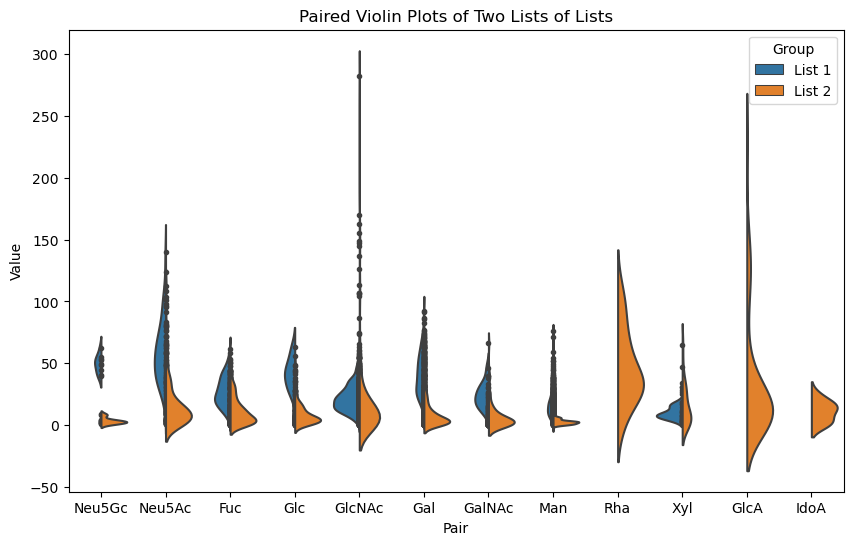

In [24]:
# N-glycans
mono_list = ['Neu5Gc', 'Neu5Ac', 'Fuc', 'Glc', 'GlcNAc', 'Gal', 'GalNAc', 'Man', 'Rha', 'Xyl', 'GlcA', 'IdoA']
nglycan_means = []
other_means = []

for mono in mono_list :
    mono_mean_flex_across_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in nglycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted')
                res = overall_monosaccharide_flexibility(isvt, mode='mean')
                val_list = [res[key] for key in res if mono in key]
                for v in val_list:
                    mono_mean_flex_across_glycans.append(v)
            except: 
                print("This glycan failed: " + g)

    nglycan_means.append(mono_mean_flex_across_glycans)

    #Others
    mono_mean_flex_across_other_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in other_glycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                isvt = inter_structure_variability_table(my_glycans_path, g, link_type = 'beta', mode = 'weighted')
                res = overall_monosaccharide_flexibility(isvt, mode='mean')
                val_list = [res[key] for key in res if mono in key]
                for v in val_list:
                    mono_mean_flex_across_other_glycans.append(v)
            except: 
                print("This glycan failed: " + g)

    other_means.append(mono_mean_flex_across_other_glycans)

data = []
for i, (sublist1, sublist2) in enumerate(zip(nglycan_means, other_means)):
    data.extend([(value, mono_list[i], 'List 1') for value in sublist1])
    data.extend([(value, mono_list[i], 'List 2') for value in sublist2])

# Convert to DataFrame
df = pd.DataFrame(data, columns=['Value', 'Pair', 'Group'])

# Create the paired violin plots
plt.figure(figsize=(10, 6))
sns.violinplot(x='Pair', y='Value', hue='Group', data=df, split=True, inner="point")

# Add a title
plt.title('Paired Violin Plots of Two Lists of Lists')

# Save the plot to a file
plt.savefig('paired_violinplots.png', dpi=300)

# Show the plot
plt.show()

In [23]:

df

,Value,Pair,Group
0,53.818723,Pair 1,List 1
1,55.064793,Pair 1,List 1
2,62.497666,Pair 1,List 1
3,40.148975,Pair 1,List 1
4,40.374790,Pair 1,List 1
...,...,...,...
18583,12.124132,IdoA,List 2
18584,18.319186,IdoA,List 2
18585,16.193336,IdoA,List 2
18586,24.431081,IdoA,List 2


Results: 
- Neu5Ac, Neu5Gc, Fuc and Man are largely more flexible in N-glycans than in other glycan types
- GalNAc is slightly more flexible in N-glycans 
- GlcNAc and Xyl are slightly more flexible in other glycan types


SASA

glycans_pdb/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc_beta_0.pdb
glycans_pdb/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc_beta_1.pdb
glycans_pdb/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc_beta_2.pdb
glycans_pdb/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc_beta_3.pdb
glycans_pdb/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc_beta_4.pdb
glycans_pdb/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc_beta_5.pdb
glycans_pdb/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)GalNAc(b1-3)Gal(a1-4)Gal(b1-4)Glc/Gal(a1-3)[Fuc(a1-2)]Gal(b1-3)Ga

[1.686127905486373, 1.7042665565472328, 1.4896394918795033, 2.3806842664097085]

glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_2.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_3.

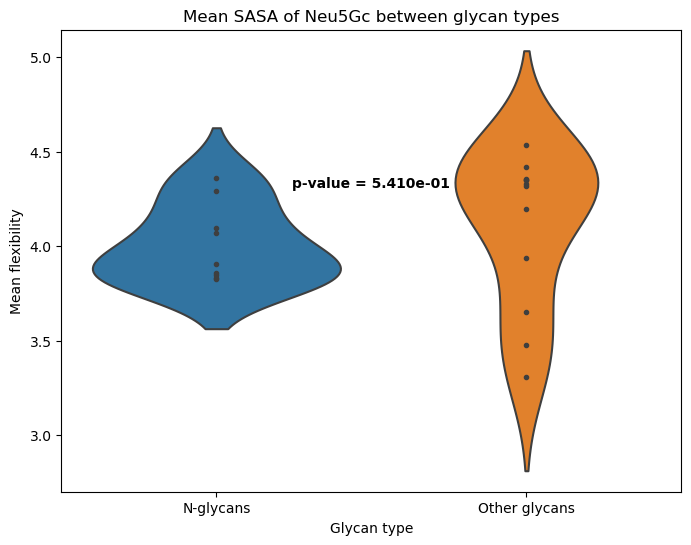

glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)G

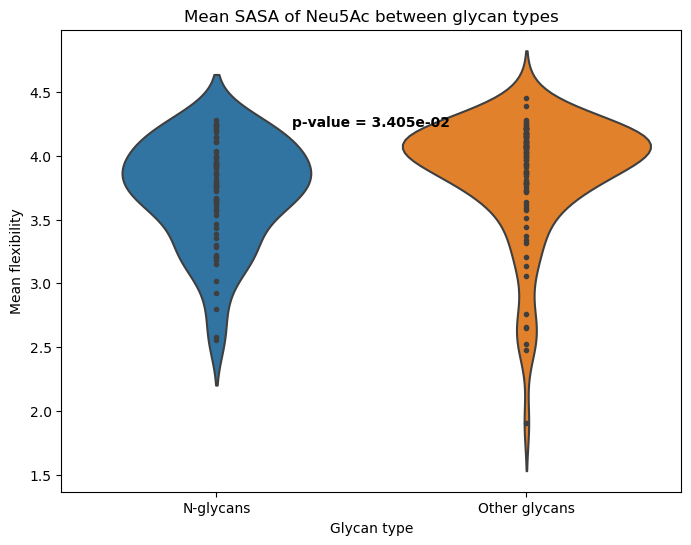

glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_0.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_1.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_2.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_3.pdb
glycans_pdb/

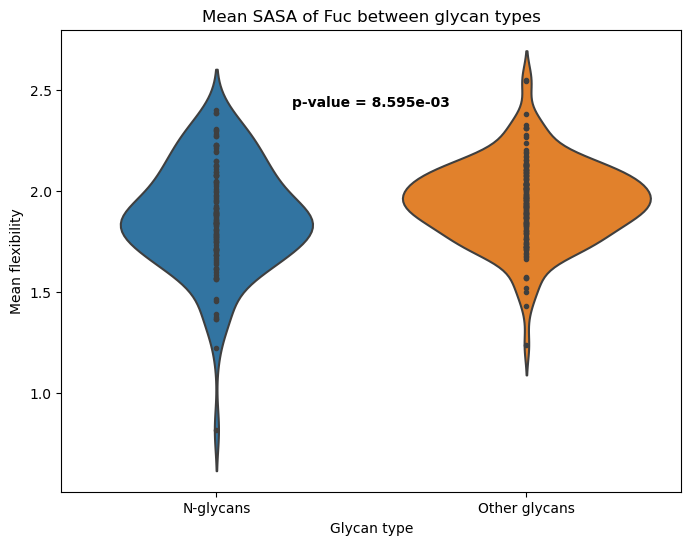

glycans_pdb/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_2.pdb
glycans_pdb/Glc(a1-2)Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-3)[Man(a1-2)Man(a1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Glc(a1-2)Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)Man(a1-3)[M

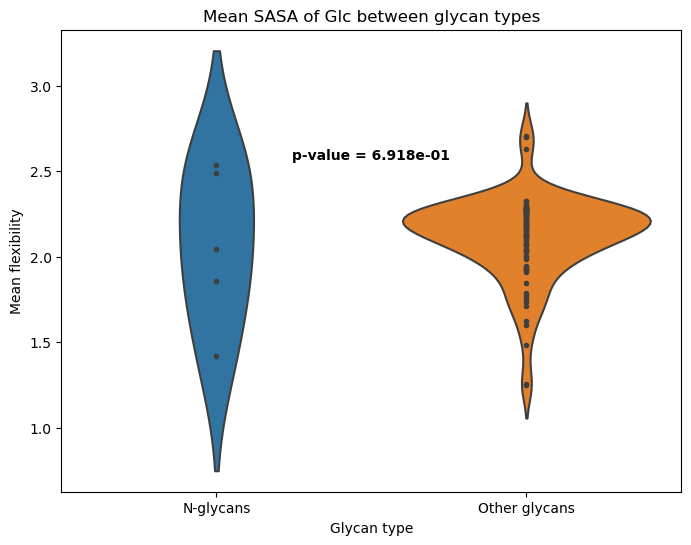

glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)G

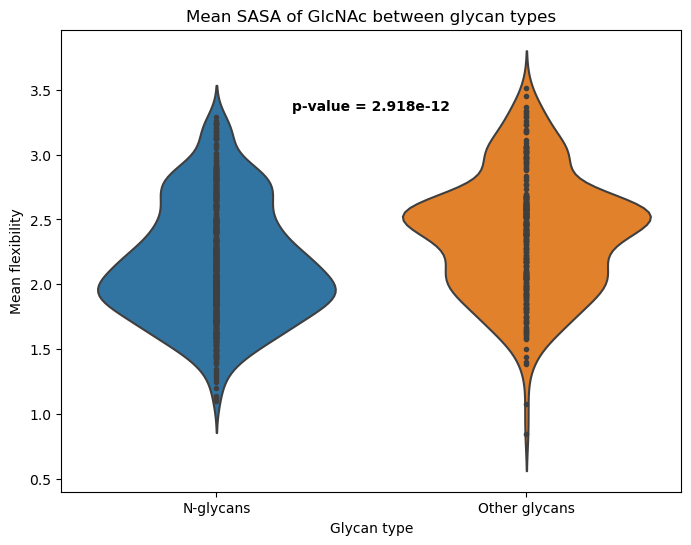

glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)G

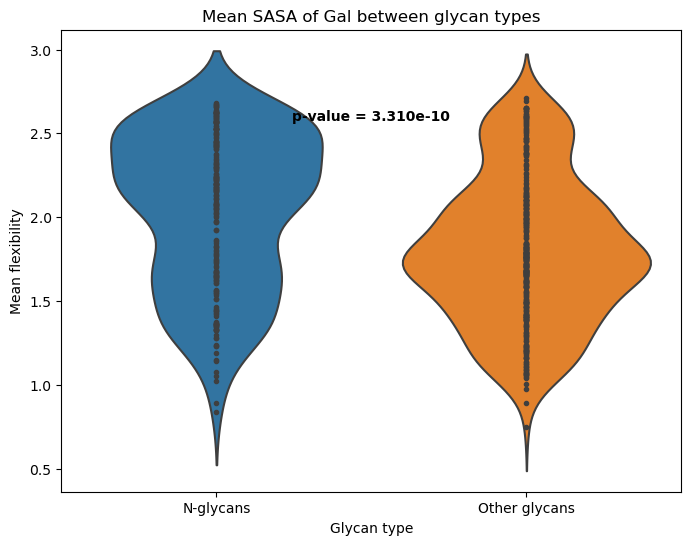

glycans_pdb/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc_beta_0.pdb
glycans_pdb/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc_beta_1.pdb
glycans_pdb/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc_beta_2.pdb
glycans_pdb/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc_beta_3.pdb
glycans_pdb/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a1-6)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc/GalNAc(b1-4)[Fuc(a1-3)]GlcNAc(b1-2)Man(a1-3)[Man(a

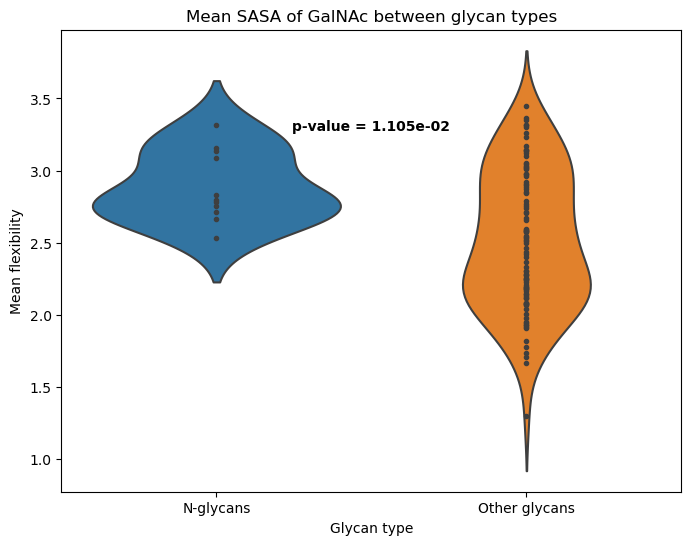

glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-4)]Man(a1-3)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-6)]Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Ac(a2-3)Gal(b1-4)G

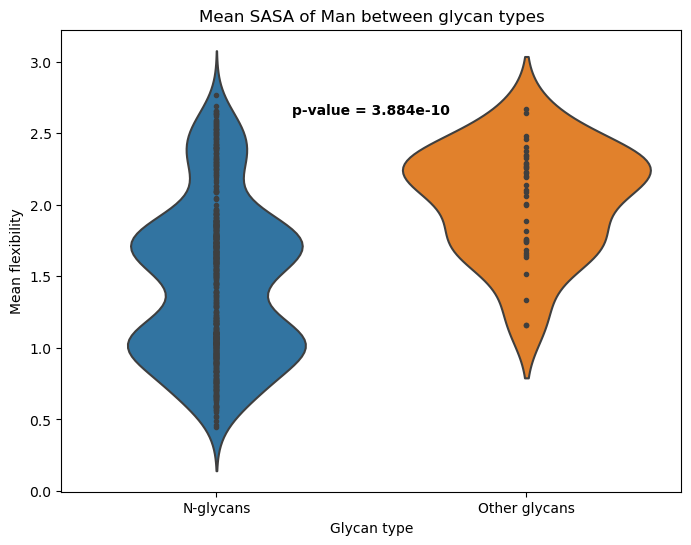

glycans_pdb/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man_beta_0.pdb
glycans_pdb/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man_beta_1.pdb
glycans_pdb/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man_beta_2.pdb
glycans_pdb/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man_beta_3.pdb
glycans_pdb/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man/Rha(a1-2)[Rha(a1-4)]GlcA(a1-2)Man(a1-2)Man_beta_4.pdb
glycans_pdb/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man_beta_0.pdb
glycans_pdb/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man_beta_1.pdb
glycans_pdb/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man/Rha(a1-3)Rha(a1-3)Man(a1-2)Man(a1-2)[Glc(a1-4)Gal(a1-6)]Man_beta_2.pdb
glycans_pdb/Rha(a1-3)Rha(a

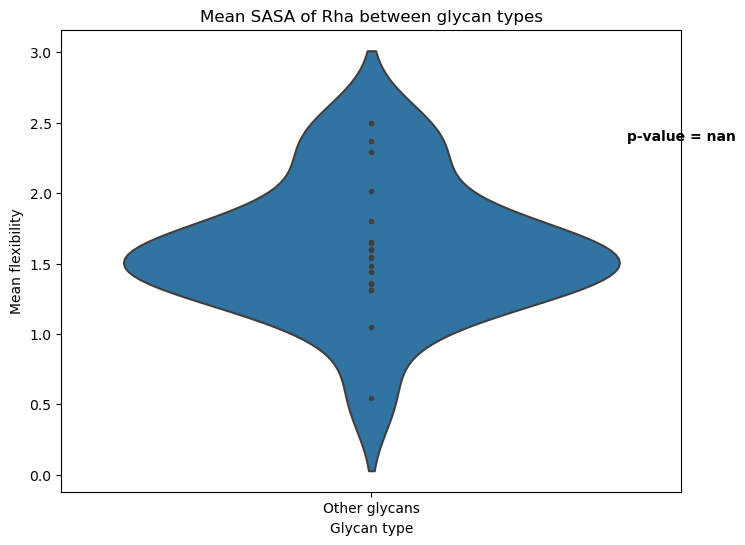

glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_0.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_1.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_2.pdb
glycans_pdb/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc/Gal(b1-3)GlcNAc(b1-2)Man(a1-3)[Gal(b1-3)GlcNAc(b1-2)Man(a1-6)][Xyl(b1-2)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-3)]GlcNAc_beta_3.pdb
glycans_pdb/

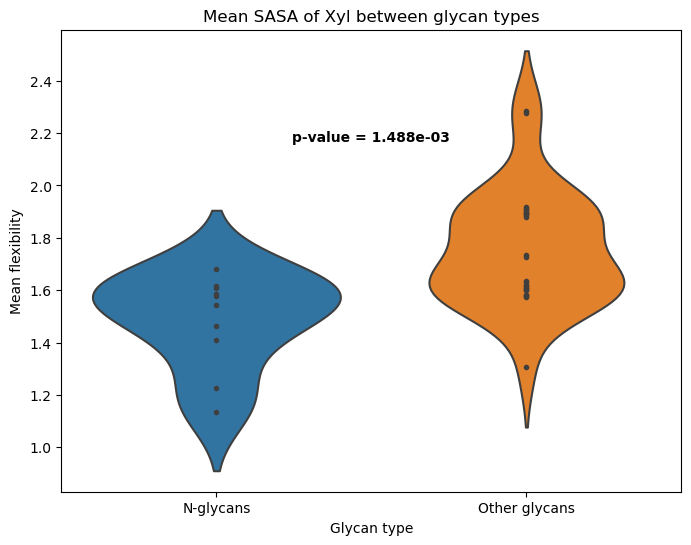

glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_0.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_1.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_2.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_3.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_4.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS/GlcA(b1-4)GlcNAc(a1-4)IdoA2S(a1-4)GlcNS_beta_5.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_0.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_1.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_2.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a

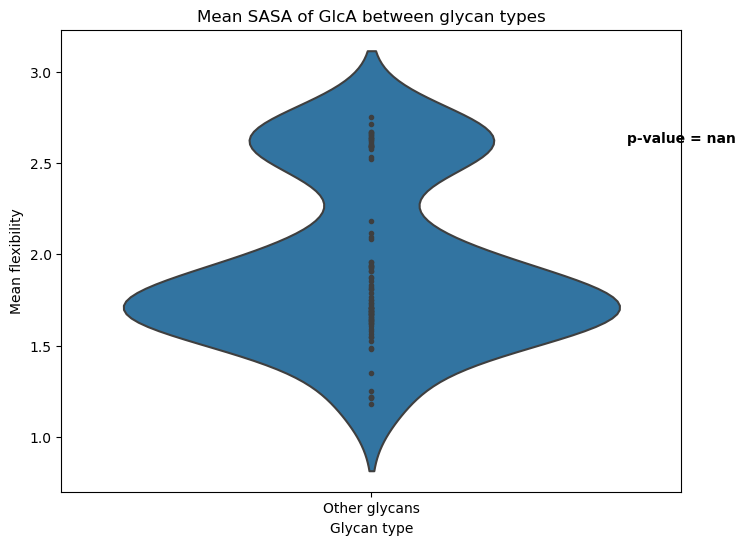

glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_0.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_1.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_2.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_3.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_4.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_0.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc_beta_1.pdb
glycans_pdb/GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc(a1-4)GlcA(b1-4)GlcNAc(a1-4)IdoA(a1-4)GlcNAc/GlcA(b1-4)GlcNAc(a1-4)

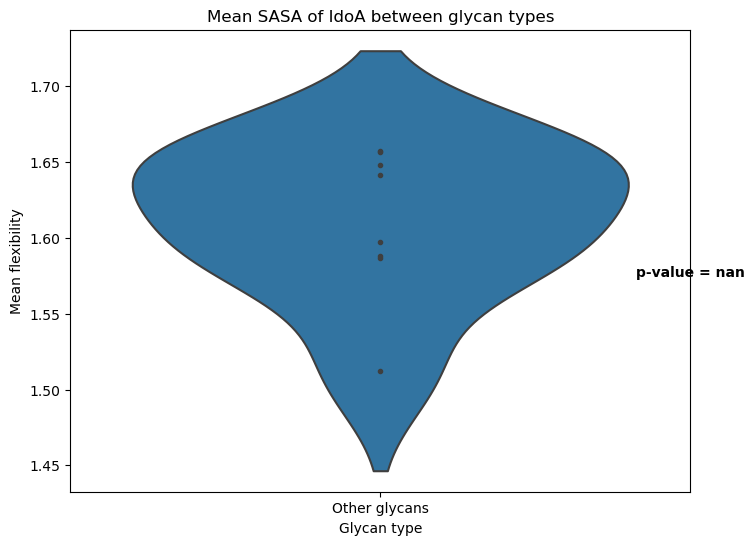

In [33]:
from glycowork.motif.annotate import *
from scipy.stats import ttest_ind

mono_list = ['Neu5Gc', 'Neu5Ac', 'Fuc', 'Glc', 'GlcNAc', 'Gal', 'GalNAc', 'Man', 'Rha', 'Xyl', 'GlcA', 'IdoA']
for mono in mono_list :
    mono_mean_flex_across_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in nglycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
                val_list = resdf['Weighted Score'][resdf['Monosaccharide'].str.contains(mono+'(', regex=False)==True].to_list()
                for v in val_list:
                    mono_mean_flex_across_glycans.append(v)
            except: 
                print("This glycan failed: " + g)

    #Others
    mono_mean_flex_across_other_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in other_glycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
                val_list = resdf['Weighted Score'][resdf['Monosaccharide'].str.contains(mono+'(', regex=False)==True].to_list()
                for v in val_list:
                    mono_mean_flex_across_other_glycans.append(v)
            except: 
                print("This glycan failed: " + g)


    data = pd.DataFrame({
        'Mean flexibility': mono_mean_flex_across_glycans + mono_mean_flex_across_other_glycans,
        'Glycan type': ['N-glycans'] * len(mono_mean_flex_across_glycans) + ['Other glycans'] * len(mono_mean_flex_across_other_glycans)
    })

    # Compute the p-value
    t_stat, p_value = ttest_ind(mono_mean_flex_across_glycans, mono_mean_flex_across_other_glycans)

    # Display the p-value on the plot
    plt.figure(figsize=(8, 6))
    sns.violinplot(x='Glycan type', y='Mean flexibility', data=data, inner="point")
    plt.text(0.5, max(mono_mean_flex_across_glycans + mono_mean_flex_across_other_glycans) * 0.95, f'p-value = {p_value:.3e}',
            horizontalalignment='center', size='medium', color='black', weight='semibold')


    # Save the plot to a file
    plt.savefig(mono + '_mean_sasa_between_glycans.png', dpi=300)

    # Create the violin plot

    plt.title('Mean SASA of ' + mono + ' between glycan types')
    plt.show()

glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_0.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_1.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_2.pdb
glycans_pdb/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc/Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-3)[Neu5Gc(a2-6)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)]Man(b1-4)GlcNAc(b1-4)GlcNAc_beta_3.

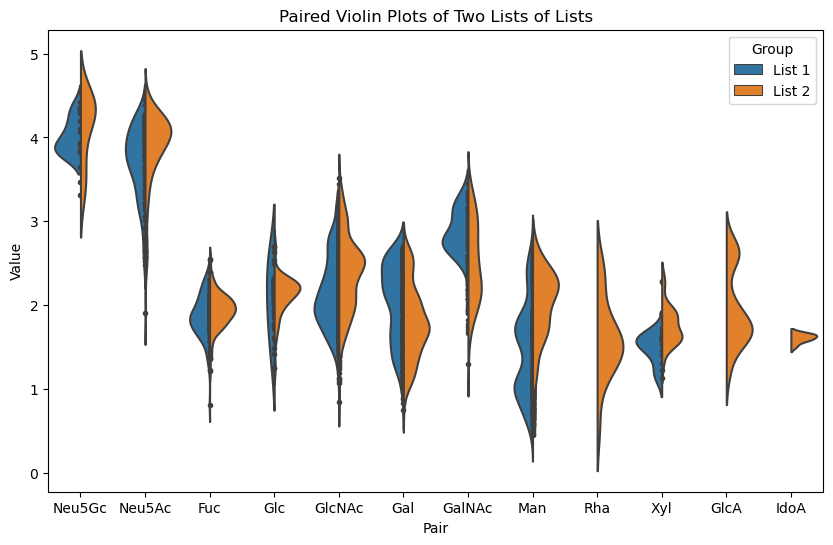

In [34]:
# N-glycans
mono_list = ['Neu5Gc', 'Neu5Ac', 'Fuc', 'Glc', 'GlcNAc', 'Gal', 'GalNAc', 'Man', 'Rha', 'Xyl', 'GlcA', 'IdoA']
nglycan_means = []
other_means = []

for mono in mono_list :
    mono_mean_flex_across_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in nglycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
                val_list = resdf['Weighted Score'][resdf['Monosaccharide'].str.contains(mono+'(', regex=False)==True].to_list()
                for v in val_list:
                    mono_mean_flex_across_glycans.append(v)
            except: 
                print("This glycan failed: " + g)

    nglycan_means.append(mono_mean_flex_across_glycans)

    #Others
    mono_mean_flex_across_other_glycans = [] #mean flexibility of all specified monosaccharides (ie Neu5Ac) in all tested glycans
    for g in other_glycans :
        compo = get_k_saccharides([g], size = 1, just_motifs=True)[0]
        if mono in compo :
            my_glycans_path = "glycans_pdb/"
            try :
                resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
                val_list = resdf['Weighted Score'][resdf['Monosaccharide'].str.contains(mono+'(', regex=False)==True].to_list()
                for v in val_list:
                    mono_mean_flex_across_other_glycans.append(v)
            except: 
                print("This glycan failed: " + g)

    other_means.append(mono_mean_flex_across_other_glycans)

data = []
for i, (sublist1, sublist2) in enumerate(zip(nglycan_means, other_means)):
    data.extend([(value, mono_list[i], 'List 1') for value in sublist1])
    data.extend([(value, mono_list[i], 'List 2') for value in sublist2])

# Convert to DataFrame
df = pd.DataFrame(data, columns=['Value', 'Pair', 'Group'])

# Create the paired violin plots
plt.figure(figsize=(10, 6))
sns.violinplot(x='Pair', y='Value', hue='Group', data=df, split=True, inner="point")

# Add a title
plt.title('Paired Violin Plots of Two Lists of Lists')

# Save the plot to a file
plt.savefig('paired_violinplots.png', dpi=300)

# Show the plot
plt.show()

## 3 - Silhouette analysis

In [9]:
sil = group_by_silhouette(glycoshape_glycans)
print(sil)

#Count which topological groups are the most common --> targetting them for further analysis
c = Counter(sil['topological_group'].to_list())
print(c.most_common())

                                                glycan  \
0    Neu5Ac(a2-3)Gal(b1-4)GlcNAc(b1-2)[Neu5Ac(a2-3)...   
1    Fuc(a1-3)[Gal(b1-4)]GlcNAc(b1-3)Gal(b1-4)[Fuc(...   
92                                  GlcNAc(b1-4)GlcNAc   
100                                 Neu5Ac(a2-6)GalNAc   
129                                       Glc(a1-4)Glc   
..                                                 ...   
441  Man(a1-3)[Man(a1-6)]Man(a1-6)[Man(a1-3)][GlcNA...   
442  Fuc(a1-3)[Gal(b1-4)]GlcNAc(b1-2)[GlcNAc(b1-4)]...   
443  Glc(a1-2)Glc(a1-3)Glc(a1-3)Man(a1-2)Man(a1-2)M...   
445  Neu5Ac(a2-6)Gal(b1-4)GlcNAc(b1-2)[Gal(b1-4)Glc...   
449  Fuc(a1-3)[Gal(b1-4)]GlcNAc(b1-2)Man(a1-3)[Fuc(...   

                  silhouette  topological_group  
0    XXX[XXX]X[XXX[XXX]X]XXX                  0  
1                X[X]XX[X]XX                  1  
92                        XX                  2  
100                       XX                  2  
129                       XX                  2  
.. 

In [10]:
sil[sil['topological_group'].values==4]

,glycan,silhouette,topological_group
393,GlcA3S(b1-3)Gal(b1-4)GlcNAc,XXX,4
162,Neu5Ac(a2-6)GalNAc(a1-3)GalNAc,XXX,4
66,Neu5Gc(a2-3)Gal(b1-3)GlcNAc,XXX,4
253,Neu5Gc(a2-3)Gal(b1-4)Glc,XXX,4
382,GalNAc(b1-4)Gal(b1-4)Glc,XXX,4
76,Neu5Ac(a2-3)Gal(b1-3)GlcNAc,XXX,4
364,Gal(b1-6)Gal(b1-4)Glc,XXX,4
87,Man(b1-4)GlcNAc(b1-4)GlcNAc,XXX,4
154,Neu5Gc(a2-3)Gal(b1-3)GalNAc,XXX,4
348,Neu5Ac(a2-3)Gal(b1-4)GlcNAc,XXX,4


For a given conformational group, check if the cluster frequency distribution is the same 

In [18]:
topo_group = 4
g_with_major, g_without_major = glycan_cluster_pattern(threshold = 50) 
topo_major = []
topo_other = []
print("Glycans with one major cluster:\n")
for g in sil['glycan'][sil['topological_group']==topo_group].to_list():
    if g in g_with_major :
        print(g + ' ' + str(get_glycan_clusters_frequency(g)))
        topo_major.append(g)

print("\nGlycans without a major cluster:\n")
for g in sil['glycan'][sil['topological_group']==topo_group].to_list():
    if g in g_without_major :
        print(g + ' ' + str(get_glycan_clusters_frequency(g)))
        topo_other.append(g)

Number of glycans with one major cluster: 104
Number of glycans without a major cluster: 344
Glycans with one major cluster:

GlcA3S(b1-3)Gal(b1-4)GlcNAc [54.75, 20.05, 10.46, 8.87, 5.87]
Neu5Gc(a2-3)Gal(b1-4)Glc [56.67, 28.43, 14.9]
Neu5Ac(a2-3)Gal(b1-3)GlcNAc [74.11, 21.74, 4.15]
Gal(b1-6)Gal(b1-4)Glc [60.12, 16.0, 15.16, 8.73]
Neu5Ac(a2-6)Gal(b1-4)GlcNAc [50.72, 25.52, 23.75]
Neu5Gc9Me(a2-3)Gal(b1-3)GlcNAc [67.48, 18.27, 14.25]
GlcNAc(b1-3)Gal(b1-4)Glc [54.23, 35.53, 10.24]
GalNAc(b1-3)GlcNAc(b1-4)Man [94.77, 3.43, 1.8]
Neu5Gc(a2-3)Gal(b1-4)GlcNAc [55.73, 22.87, 10.93, 10.48]
Neu5Ac(a2-6)GalNAc(b1-3)GlcNAc [52.41, 24.52, 23.07]
Neu5Ac9Me(a2-3)Gal(b1-3)GlcNAc [51.59, 31.63, 16.78]
Neu5Ac(a2-6)Gal(b1-4)Glc [52.44, 25.36, 22.19]

Glycans without a major cluster:

Neu5Ac(a2-6)GalNAc(a1-3)GalNAc [22.56, 15.58, 12.78, 11.39, 9.97, 8.2, 6.36, 5.04, 4.54, 3.58]
Neu5Gc(a2-3)Gal(b1-3)GlcNAc [21.8, 18.2, 17.57, 15.39, 8.44, 8.36, 3.96, 3.48, 2.8]
GalNAc(b1-4)Gal(b1-4)Glc [32.15, 26.71, 23.84, 

In [45]:
resdf

,Monosaccharide_id,Monosaccharide,Mean Score,Median Score,Weighted Score,Standard Deviation,Coefficient of Variation
0,1,-R,0.384369,0.360195,0.397837,0.040348,0.104972
1,2,GlcNS6S(a1-1),2.467228,2.524400,2.470647,0.105340,0.042696
2,3,NaN,1.088138,1.079950,1.093192,0.034572,0.031772
3,4,IdoA(a1-4),1.566167,1.592746,1.586918,0.075472,0.048189
4,5,GlcNS(a1-4),2.530159,2.523321,2.542586,0.062356,0.024645
5,6,GlcA(b1-4),2.633476,2.647519,2.635554,0.032564,0.012365


In [23]:
list_of_res = []
dict_res = {}
for g in topo_major :
    print(g)
    my_glycans_path = "glycans_pdb/"
    try :
        resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
        res = [v for v in resdf['Weighted Score'].to_list()]
        monolist = [v for v in resdf['Monosaccharide'].to_list()]
        list_of_res.append(res)
        dict_res[g] = res
        for x in range(0,len(res)):
            print(monolist[x] + ' : ' + str(res[x]))
    except: 
        print("This glycan failed: " + g)



GlcA3S(b1-3)Gal(b1-4)GlcNAc
-R : 0.41422806566655634
GlcNAc(b1-1) : 3.020143629533972
Gal(b1-4) : 1.950969492179656
GlcA3S(b1-3) : 2.097085356880573
This glycan failed: GlcA3S(b1-3)Gal(b1-4)GlcNAc
Neu5Gc(a2-3)Gal(b1-4)Glc
-R : 0.5174087140485645
Glc(b1-1) : 2.2887843662847533
Gal(b1-4) : 1.651869290357013
Neu5Gc(a2-3) : 4.41969593359119
Neu5Ac(a2-3)Gal(b1-3)GlcNAc
-R : 0.5104940091118217
GlcNAc(b1-1) : 2.912394011130452
Gal(b1-3) : 1.6624762431764744
Neu5Ac(a2-3) : 4.214625870722777
Gal(b1-6)Gal(b1-4)Glc
-R : 0.45918216396295175
Glc(b1-1) : 2.1120855892237493
Gal(b1-4) : 1.9885618148893343
Gal(b1-6) : 2.4747001507344
Neu5Ac(a2-6)Gal(b1-4)GlcNAc
-R : 0.3879899365706543
GlcNAc(b1-1) : 2.9290300744106665
Gal(b1-4) : 1.7089791008376085
Neu5Ac(a2-6) : 4.267455298719907
Neu5Gc9Me(a2-3)Gal(b1-3)GlcNAc
-R : 0.437882556925714
GlcNAc(b1-1) : 2.880404999353178
Gal(b1-3) : 1.466837809741986
Neu5Gc9Me(a2-3) : 3.90844639930469
This glycan failed: Neu5Gc9Me(a2-3)Gal(b1-3)GlcNAc
GlcNAc(b1-3)Gal(b1-4)G

In [32]:
import numpy as np
from sklearn.decomposition import PCA
import plotly.express as px
import pandas as pd



# Find the maximum length of the lists
max_length = max(len(lst) for lst in dict_res.values())

# Pad all lists to the maximum length with zeros (or any other placeholder)
padded_data = {key: lst + [0]*(max_length - len(lst)) for key, lst in dict_res.items()}

# Convert dictionary values to a list of lists (matrix-like structure)
data_matrix = np.array(list(padded_data.values()))

# Perform PCA
pca = PCA(n_components=2)
pca_results = pca.fit_transform(data_matrix)

# Convert the PCA results to a DataFrame for easier plotting
pca_df = pd.DataFrame(pca_results, columns=['PC1', 'PC2'])

# Add the corresponding keys as a new column
pca_df['Label'] = list(dict_res.keys())

# Create the plot
fig = px.scatter(pca_df, x='PC1', y='PC2', text='Label')

# Update hover settings to show labels
fig.update_traces(marker=dict(size=10), selector=dict(mode='markers+text'))
fig.update_layout(title="PCA Plot", hovermode='closest')

# Display the plot
fig.show()


In [34]:
print(topo_major)

['GlcA3S(b1-3)Gal(b1-4)GlcNAc', 'Neu5Gc(a2-3)Gal(b1-4)Glc', 'Neu5Ac(a2-3)Gal(b1-3)GlcNAc', 'Gal(b1-6)Gal(b1-4)Glc', 'Neu5Ac(a2-6)Gal(b1-4)GlcNAc', 'Neu5Gc9Me(a2-3)Gal(b1-3)GlcNAc', 'GlcNAc(b1-3)Gal(b1-4)Glc', 'GalNAc(b1-3)GlcNAc(b1-4)Man', 'Neu5Gc(a2-3)Gal(b1-4)GlcNAc', 'Neu5Ac(a2-6)GalNAc(b1-3)GlcNAc', 'Neu5Ac9Me(a2-3)Gal(b1-3)GlcNAc', 'Neu5Ac(a2-6)Gal(b1-4)Glc']


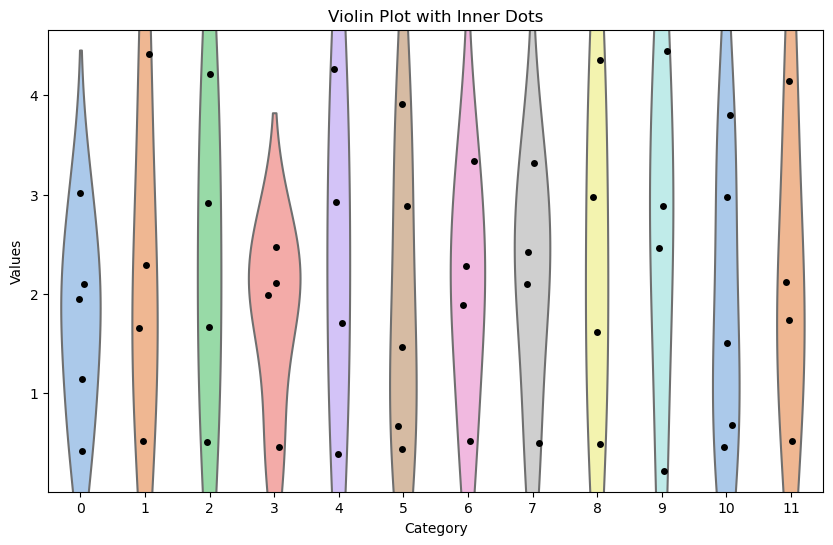

In [22]:
# Convert the list of lists into a DataFrame
df = pd.DataFrame(list_of_res).T.melt(var_name='Category', value_name='Value')

# Create the violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='Category', y='Value', data=df, inner=None, palette='pastel')

# Add inner dots using stripplot
sns.stripplot(x='Category', y='Value', data=df, color='k', size=5, jitter=True)

# Set labels and title
plt.xlabel('Category')
plt.ylabel('Values')
plt.title('Violin Plot with Inner Dots')

# Display the plot
plt.show()

In [35]:
list_of_res = []
dict_res = {}
for g in topo_other :
    print(g)
    my_glycans_path = "glycans_pdb/"
    try :
        resdf = get_sasa_table(my_glycans_path, g, mode = 'beta')
        res = [v for v in resdf['Weighted Score'].to_list()]
        monolist = [v for v in resdf['Monosaccharide'].to_list()]
        list_of_res.append(res)
        dict_res[g] = res
        for x in range(0,len(res)):
            print(monolist[x] + ' : ' + str(res[x]))
    except: 
        print("This glycan failed: " + g)



Neu5Ac(a2-6)GalNAc(a1-3)GalNAc
-R : 0.4562787471815944
GalNAc(b1-1) : 2.5868723334229315
GalNAc(a1-3) : 2.3989930620551863
Neu5Ac(a2-6) : 4.1840341670439
Neu5Gc(a2-3)Gal(b1-3)GlcNAc
-R : 0.4530917834669352
GlcNAc(b1-1) : 3.0128001185748374
Gal(b1-3) : 1.59064705628308
Neu5Gc(a2-3) : 4.35395110425367
GalNAc(b1-4)Gal(b1-4)Glc
-R : 0.5231429499819874
Glc(b1-1) : 2.128894353183685
Gal(b1-4) : 1.7185741956093117
GalNAc(b1-4) : 3.1009186349966913
Man(b1-4)GlcNAc(b1-4)GlcNAc
-R : 0.42867445393465464
GlcNAc(b1-1) : 2.877753615277843
GlcNAc(b1-4) : 2.619680749829649
Man(b1-4) : 2.5937559717880103
Neu5Gc(a2-3)Gal(b1-3)GalNAc
-R : 0.4567364637997256
GalNAc(b1-1) : 2.9613412961762315
Gal(b1-3) : 1.5527902528000108
Neu5Gc(a2-3) : 4.330272462484169
Neu5Ac(a2-3)Gal(b1-4)GlcNAc
-R : 0.4259065959423781
GlcNAc(b1-1) : 3.0093140052956535
Gal(b1-4) : 1.6198096573796823
Neu5Ac(a2-3) : 4.170488355819718
Neu5Ac(a2-3)Gal(b1-4)Glc
-R : 0.48453272806182507
Glc(b1-1) : 2.1712422541462115
Gal(b1-4) : 1.6065427163

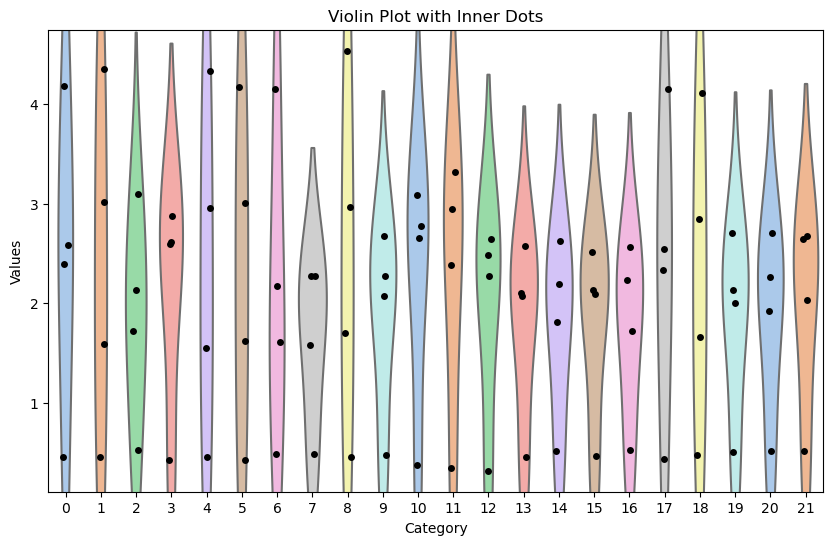

In [36]:
# Convert the list of lists into a DataFrame
df = pd.DataFrame(list_of_res).T.melt(var_name='Category', value_name='Value')

# Create the violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='Category', y='Value', data=df, inner=None, palette='pastel')

# Add inner dots using stripplot
sns.stripplot(x='Category', y='Value', data=df, color='k', size=5, jitter=True)

# Set labels and title
plt.xlabel('Category')
plt.ylabel('Values')
plt.title('Violin Plot with Inner Dots')

# Display the plot
plt.show()

In [39]:
print(topo_other)

['Neu5Ac(a2-6)GalNAc(a1-3)GalNAc', 'Neu5Gc(a2-3)Gal(b1-3)GlcNAc', 'GalNAc(b1-4)Gal(b1-4)Glc', 'Man(b1-4)GlcNAc(b1-4)GlcNAc', 'Neu5Gc(a2-3)Gal(b1-3)GalNAc', 'Neu5Ac(a2-3)Gal(b1-4)GlcNAc', 'Neu5Ac(a2-3)Gal(b1-4)Glc', 'Xyl(a1-3)Xyl(a1-3)Glc', 'Neu5Gc(a2-6)Gal(b1-4)GlcNAc', 'Fuc(a1-2)Gal(b1-4)GlcNAc', 'GlcNAc(b1-6)GlcNAc(b1-6)GlcNAc', 'GlcNAc(b1-4)GlcNAc(b1-4)GlcNAc', 'Gal(b1-4)GlcNAc(b1-2)Man', 'Fuc(a1-2)Gal(b1-3)GalNAc', 'GalA(a1-4)GlcA(b1-4)Glc', 'Fuc(a1-2)Gal(b1-3)GlcNAc', 'Gal(a1-4)Gal(b1-4)Glc', 'Neu5Ac9Ac(a2-3)Gal(b1-4)GlcNAc', 'Neu5Ac(a2-6)GalNAc(a1-3)GlcNAc', 'Neu5Ac(a2-9)Neu5Ac(a2-9)Neu5Ac', 'Neu5Ac9Ac(a2-6)Gal(b1-4)GlcNAc', 'Neu5Ac(a2-8)Neu5Ac(a2-8)Neu5Ac', 'Neu5Ac(a2-3)Gal(b1-3)GalNAc', 'Glc(a1-6)Man(a1-3)Gal', 'Gal(b1-3)Gal(b1-4)Glc', 'Gal(b1-4)GlcNAc(b1-3)Fuc']


In [37]:


# Find the maximum length of the lists
max_length = max(len(lst) for lst in dict_res.values())

# Pad all lists to the maximum length with zeros (or any other placeholder)
padded_data = {key: lst + [0]*(max_length - len(lst)) for key, lst in dict_res.items()}

# Convert dictionary values to a list of lists (matrix-like structure)
data_matrix = np.array(list(padded_data.values()))

# Perform PCA
pca = PCA(n_components=2)
pca_results = pca.fit_transform(data_matrix)

# Convert the PCA results to a DataFrame for easier plotting
pca_df = pd.DataFrame(pca_results, columns=['PC1', 'PC2'])

# Add the corresponding keys as a new column
pca_df['Label'] = list(dict_res.keys())

# Create the plot
fig = px.scatter(pca_df, x='PC1', y='PC2', text='Label')

# Update hover settings to show labels
fig.update_traces(marker=dict(size=10), selector=dict(mode='markers+text'))
fig.update_layout(title="PCA Plot", hovermode='closest')

# Display the plot
fig.show()
